In [ ]:
! pip install --quiet bertopic
! pip install --quiet underthesea
! pip install --quiet top2vec
! pip install --quiet top2vec[sentence_encoders]
! pip install --quiet octis

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.5/158.5 kB 3.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 66.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 10.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 171.5/171.5 kB 21.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.8/56.8 kB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.9/20.9 MB 63.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 52.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 657.8/657.8 kB 49.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 51.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 589.8/589.8 MB 1.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.3/5.3 MB

In [ ]:
from distutils.dir_util import copy_tree
copy_tree("/content/drive/MyDrive/Thesis: Topic Modelling/Code/utils", "./utils/")

['./utils/vietnamese-stopwords.txt',
 './utils/bertopic_model/topic_embeddings.safetensors',
 './utils/bertopic_model/topics.json',
 './utils/bertopic_model/config.json',
 './utils/bertopic_model/ctfidf.safetensors',
 './utils/bertopic_model/ctfidf_config.json',
 './utils/vncorenlp/models/dep/vi-dep.xz',
 './utils/vncorenlp/models/ner/vi-ner.xz',
 './utils/vncorenlp/models/ner/vi-500brownclusters.xz',
 './utils/vncorenlp/models/ner/vi-pretrainedembeddings.xz',
 './utils/vncorenlp/models/postagger/vi-tagger',
 './utils/vncorenlp/models/wordsegmenter/wordsegmenter.rdr',
 './utils/vncorenlp/models/wordsegmenter/vi-vocab',
 './utils/vncorenlp/VnCoreNLP-1.2.jar',
 './utils/data_preprocessing.py',
 './utils/data_preprocessing_v2.py',
 './utils/__pycache__/data_preprocessing_v2.cpython-310.pyc']

In [ ]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

import gensim
from gensim import corpora
from gensim.models.coherencemodel import CoherenceModel
from underthesea import word_tokenize
from utils.data_preprocessing_v2 import *
from gensim.models.ldamodel import LdaModel
from gensim.models.lsimodel import LsiModel
from top2vec import Top2Vec

from octis.evaluation_metrics.diversity_metrics import TopicDiversity
from octis.evaluation_metrics.coherence_metrics import Coherence

# from bertopic import BERTopic
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

with open("/content/utils/vietnamese-stopwords.txt") as f:
    STOPWORDS = f.readlines()
    STOPWORDS = [remove_all_tag(i).strip() for i in STOPWORDS]
STOPWORDS.extend(["negative", "positive"])

In [ ]:
class UnsupervisedModels:
  def __init__(self, data, model = None, clean_data = None):
    self.data = data
    self.model_name = model
    self.evaluation = {}
    self.clean_data = clean_data
    self.id2word = None
    self.corpus = None
    self.trained_model = None
  def preprocess(self):
    self.data["comment"] = self.data["comment"].astype(str)
    self.clean_data = self.data.copy()

    def tokenize(x):
      x = word_tokenize(x)
      x = [word for word in x if word not in STOPWORDS]
      return x
    self.clean_data["clean_comment"] = self.clean_data["comment"].apply(lambda x: cleaning(x))
    self.clean_data["tokens"] = self.clean_data["clean_comment"].apply(lambda x: tokenize(x))
    self.clean_data = self.clean_data[self.clean_data["tokens"].apply(len) > 0]
    return self.clean_data


  def train_gensim_models(self, num_topics = 10, passes = 15, evaluate = False):
    if self.clean_data is None:
      clean_data = self.preprocess()
    else:
      clean_data = self.clean_data.copy()
    data_words_without_stopwords = list(self.clean_data["tokens"])
    self.id2word = corpora.Dictionary(data_words_without_stopwords)
    self.corpus = [self.id2word.doc2bow(text) for text in data_words_without_stopwords]

    if self.model_name == "LDA":
      model = LdaModel(self.corpus, num_topics=10, id2word=self.id2word, passes=15, random_state = 60, per_word_topics=True)
    elif self.model_name == "LSI":
      model = LsiModel(self.corpus, num_topics=num_topics, id2word=self.id2word)

    if evaluate:
      coherence_model = CoherenceModel(model=model, texts=data_words_without_stopwords, dictionary=self.id2word, topn = 10, coherence = "c_v", processes = 1)
      coherence = coherence_model.get_coherence() # higher score = better

      unique_words = set()
      topics = {'Topic_' + str(i): [token for token, score in model.show_topic(i, topn=10)] for i in range(0, model.num_topics)}
      for topic in topics:
          unique_words = unique_words.union(set(topic[:10]))
      td = len(unique_words) / (10 * len(topics))
      self.evaluation = {"Coherence Score": coherence, "Topic Diversity": td}
    self.trained_model = model
    return model

  def train_bertopic(self, vectorizer, evaluate = False, num_topics = None):
    if self.clean_data is None:
      clean_data = self.preprocess()
    else:
      clean_data = self.clean_data.copy()

    if not num_topics:
      num_topics = "auto"

    model = BERTopic(vectorizer_model=vectorizer, language="multilingual", nr_topics=num_topics)
    topics, _ = model.fit_transform(clean_data["clean_comment"])
    if evaluate:
      all_words = [word for words in clean_data["tokens"] for word in words]
      bertopic_topics = [
          [
              vals[0] if vals[0] in all_words else all_words[0]
              for vals in model.get_topic(i)[:10]
          ]
          for i in range(len(set(topics)) - 1)
      ]

      output_tm = {"topics": bertopic_topics}
      data_words = list(clean_data["tokens"])
      coherence = Coherence(texts = data_words, topk=10, measure="c_v")
      topic_diversity = TopicDiversity(topk=10)
      self.evaluation = {"Coherence Score": coherence.score(output_tm), "Topic Diversity": topic_diversity.score(output_tm)}
    return (model, topics, _)

  def get_prob_features(self, thresh = 0.1):
    rows = []
    for i in range(len(self.corpus)):
      row = []
      probs = self.trained_model[self.corpus[i]][0]
      for name, prob in probs:
        if prob and (prob > thresh):
          row.append(name)
      rows.append(row)
    return rows

  def train_top2vec(self, evaluate = False, nr_topics = None, embedding_model = "distiluse-base-multilingual-cased"):
    if self.clean_data is None:
      clean_data = self.preprocess()
    else:
      clean_data = self.clean_data.copy()
    corpus = list(clean_data["clean_comment"])
    top2vec = Top2Vec(documents=corpus, speed="learn", workers=4, embedding_model= embedding_model, tokenizer = word_tokenize)
    if nr_topics:
      top2vec.hierarchical_topic_reduction(nr_topics)
      topic_words, _, _ = top2vec.get_topics(reduced=True)
    else:
      topic_words, _, _ = top2vec.get_topics()
    if evaluate:
      tokenized = list(clean_data["tokens"])
      topics_old = [list(topic[:10]) for topic in topic_words]
      all_words = [word for words in tokenized for word in words if words]
      topics = []
      for topic in topics_old:
          words = []
          for word in topic:
              if word in all_words:
                  words.append(word)
              else:
                  print(f"error: {word}")
                  words.append(all_words[0])
          topics.append(words)
      output_tm = {
            "topics": topics,
        }
      data_words = list(tokenized)
      coherence = Coherence(texts = data_words, topk=10, measure="c_v")
      topic_diversity = TopicDiversity(topk=10)
      self.evaluation = {"Coherence Score": coherence.score(output_tm), "Topic Diversity": topic_diversity.score(output_tm)}
    return top2vec
  def get_evaluation(self):
    return self.evaluation


In [ ]:
data = pd.read_excel("/content/drive/MyDrive/Thesis: Topic Modelling/Data/final_data_with_other.xlsx")
data["comment"] = data["comment"].astype(str)

In [ ]:
"""num_topics = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
bertopic = UnsupervisedModels(data)
lda  = UnsupervisedModels(data, model = "LDA")
lsi = UnsupervisedModels(data, model = "LSI")
top2vec = UnsupervisedModels(data)
evaluate_bert = []
evaluate_lda = []
evaluate_lsi = []
evaluate_top2vec = []
for n in num_topics:
  bertopic_trained = bertopic.train_bertopic(vectorizer = vectorizer_model, evaluate = True, num_topics = n)
  lda_trained = lda.train_gensim_models(evaluate = True, num_topics = n)
  lsi_trained = lsi.train_gensim_models(evaluate = True, num_topics = n)
  top2vec_trained = top2vec.train_top2vec(evaluate = True, nr_topics = n)
  evaluate_bert.append(bertopic.evaluation)
  evaluate_lda.append(lda.evaluation)
  evaluate_lsi.append(lsi.evaluation)
  evaluate_top2vec.append(top2vec.evaluation)"""


'num_topics = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100]\nbertopic = UnsupervisedModels(data)\nlda  = UnsupervisedModels(data, model = "LDA")\nlsi = UnsupervisedModels(data, model = "LSI")\ntop2vec = UnsupervisedModels(data)\nevaluate_bert = []\nevaluate_lda = []\nevaluate_lsi = []\nevaluate_top2vec = []\nfor n in num_topics:\n  bertopic_trained = bertopic.train_bertopic(vectorizer = vectorizer_model, evaluate = True, num_topics = n)\n  lda_trained = lda.train_gensim_models(evaluate = True, num_topics = n)\n  lsi_trained = lsi.train_gensim_models(evaluate = True, num_topics = n)\n  top2vec_trained = top2vec.train_top2vec(evaluate = True, nr_topics = n)\n  evaluate_bert.append(bertopic.evaluation)\n  evaluate_lda.append(lda.evaluation)\n  evaluate_lsi.append(lsi.evaluation)\n  evaluate_top2vec.append(top2vec.evaluation)'

In [ ]:
"""bert_eval_df.to_excel("/content/drive/MyDrive/Thesis: Topic Modelling/Unsupervised eval/bert_eval_df.xlsx")
lda_eval_df.to_excel("/content/drive/MyDrive/Thesis: Topic Modelling/Unsupervised eval/lda_eval_df.xlsx")
lsi_eval_df.to_excel("/content/drive/MyDrive/Thesis: Topic Modelling/Unsupervised eval/evaluate_lsi.xlsx")
top2vec_eval_df.to_excel("/content/drive/MyDrive/Thesis: Topic Modelling/Unsupervised eval/evaluate_top2vec.xlsx")"""


'bert_eval_df.to_excel("/content/drive/MyDrive/Thesis: Topic Modelling/Unsupervised eval/bert_eval_df.xlsx")\nlda_eval_df.to_excel("/content/drive/MyDrive/Thesis: Topic Modelling/Unsupervised eval/lda_eval_df.xlsx")\nlsi_eval_df.to_excel("/content/drive/MyDrive/Thesis: Topic Modelling/Unsupervised eval/evaluate_lsi.xlsx")\ntop2vec_eval_df.to_excel("/content/drive/MyDrive/Thesis: Topic Modelling/Unsupervised eval/evaluate_top2vec.xlsx")'

In [ ]:
bert_eval_df = pd.read_excel("/content/drive/MyDrive/Thesis: Topic Modelling/Unsupervised eval/bert_eval_df.xlsx")
lda_eval_df = pd.read_excel("/content/drive/MyDrive/Thesis: Topic Modelling/Unsupervised eval/lda_eval_df.xlsx")
lsi_eval_df = pd.read_excel("/content/drive/MyDrive/Thesis: Topic Modelling/Unsupervised eval/evaluate_lsi.xlsx")
top2vec_eval_df = pd.read_excel("/content/drive/MyDrive/Thesis: Topic Modelling/Unsupervised eval/evaluate_top2vec.xlsx")
bertopic_bow_df = pd.read_excel("/content/drive/MyDrive/Thesis: Topic Modelling/Unsupervised eval/bertopic_bow.xlsx")

In [ ]:
import matplotlib.pyplot as plt

Text(0, 0.5, 'c_v score')

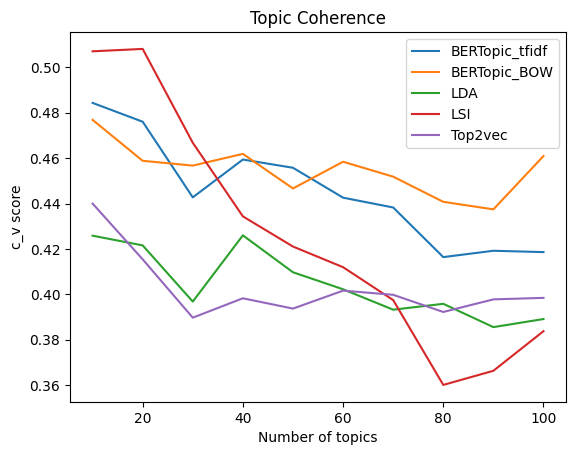

In [ ]:
num_topics = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
plt.plot(num_topics, bert_eval_df["Coherence Score"], label = "BERTopic_tfidf")
plt.plot(num_topics, bertopic_bow_df["Coherence Score"], label = "BERTopic_BOW")
plt.plot(num_topics, lda_eval_df["Coherence Score"], label = "LDA")
plt.plot(num_topics, lsi_eval_df["Coherence Score"], label = "LSI")
plt.plot(num_topics, top2vec_eval_df["Coherence Score"], label = "Top2vec")
plt.legend()
plt.title("Topic Coherence")
plt.xlabel("Number of topics")
plt.ylabel("c_v score")

Text(0, 0.5, 'Topic Diversity')

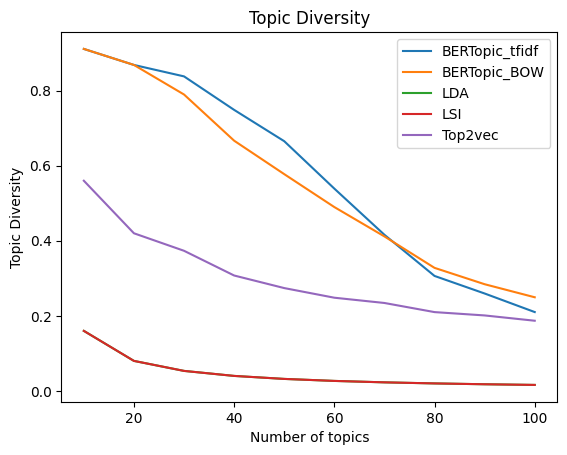

In [ ]:
num_topics = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
plt.plot(num_topics, bert_eval_df["Topic Diversity"], label = "BERTopic_tfidf")
plt.plot(num_topics, bertopic_bow_df["Topic Diversity"], label = "BERTopic_BOW")
plt.plot(num_topics, lda_eval_df["Topic Diversity"], label = "LDA")
plt.plot(num_topics, lsi_eval_df["Topic Diversity"], label = "LSI")
plt.plot(num_topics, top2vec_eval_df["Topic Diversity"], label = "Top2vec")
plt.legend()
plt.title("Topic Diversity")
plt.xlabel("Number of topics")
plt.ylabel("Topic Diversity")

# Key word from each model

## 1. LDA

In [ ]:
lda  = UnsupervisedModels(data, model = "LDA")
lda_trained = lda.train_gensim_models(evaluate = True, num_topics = 10)

In [ ]:
from wordcloud import WordCloud
import matplotlib.colors as mcolors

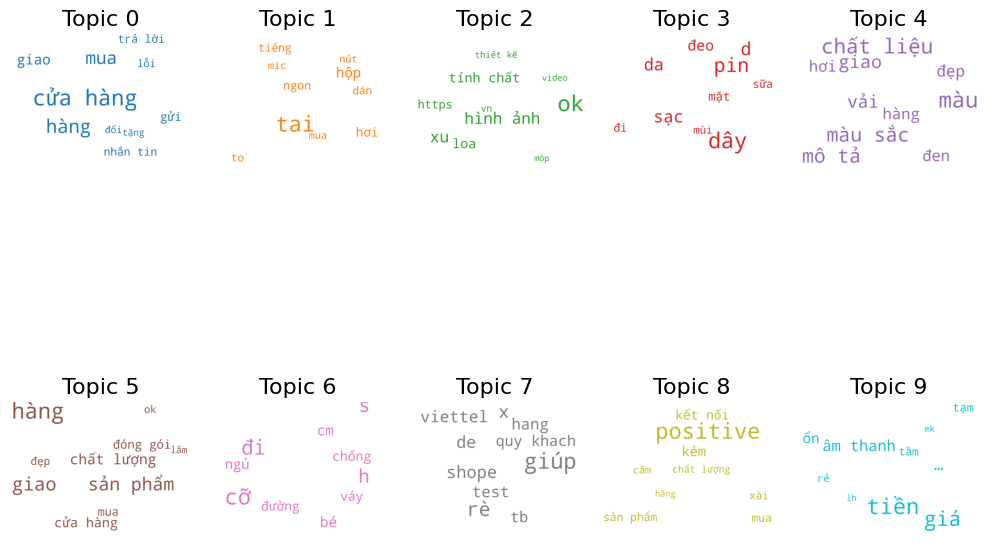

In [ ]:
cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]
cloud = WordCloud(stopwords=STOPWORDS,
                  background_color='white',
                  width=2500,
                  height=1800,
                  max_words=10,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)


topics = lda_trained.show_topics(formatted=False)

fig, axes = plt.subplots(2, 5, figsize=(10,10), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    fig.add_subplot(ax)
    topic_words = dict(topics[i][1])
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    plt.gca().imshow(cloud)
    plt.gca().set_title('Topic ' + str(i), fontdict=dict(size=16))
    plt.gca().axis('off')


plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [ ]:
topics = lda_trained.print_topics(num_words=10)
for i, topic in enumerate(topics):
    print(i, topic[1])

0 0.072*"cửa hàng" + 0.052*"hàng" + 0.045*"mua" + 0.027*"giao" + 0.019*"gửi" + 0.016*"trả lời" + 0.016*"nhắn tin" + 0.014*"lỗi" + 0.012*"đổi" + 0.011*"tặng"
1 0.106*"tai" + 0.031*"hộp" + 0.023*"hơi" + 0.021*"ngon" + 0.019*"tiếng" + 0.018*"to" + 0.018*"dán" + 0.015*"mic" + 0.015*"mua" + 0.015*"nút"
2 0.091*"ok" + 0.041*"xu" + 0.041*"hình ảnh" + 0.028*"loa" + 0.028*"tính chất" + 0.021*"https" + 0.013*"vn" + 0.011*"thiết kế" + 0.011*"video" + 0.010*"móp"
3 0.049*"dây" + 0.039*"pin" + 0.033*"d" + 0.029*"da" + 0.028*"sạc" + 0.021*"đeo" + 0.014*"mặt" + 0.012*"đi" + 0.012*"sữa" + 0.010*"mùi"
4 0.048*"màu" + 0.042*"chất liệu" + 0.038*"màu sắc" + 0.038*"mô tả" + 0.032*"giao" + 0.030*"vải" + 0.025*"đẹp" + 0.023*"hàng" + 0.023*"hơi" + 0.023*"đen"
5 0.120*"hàng" + 0.084*"giao" + 0.079*"sản phẩm" + 0.048*"chất lượng" + 0.040*"cửa hàng" + 0.034*"đóng gói" + 0.032*"mua" + 0.028*"đẹp" + 0.024*"ok" + 0.020*"lắm"
6 0.025*"cỡ" + 0.022*"đi" + 0.019*"s" + 0.018*"h" + 0.010*"bé" + 0.009*"cm" + 0.009*"ngủ" +

In [ ]:
def format_topics_sentences(ldamodel, corpus, texts):
    sent_topics_df = pd.DataFrame()
    rows = []
    for i, row in enumerate(ldamodel[corpus]):
        row = sorted(row[0], key=lambda x: (x[1]), reverse=True)
        for j, (topic_num, prop_topic) in enumerate(row):
            if j == 0:
                wp = ldamodel.show_topic(topic_num)
                topic_keywords = ", ".join([word for word, prop in wp])
                rows.append(pd.Series([int(topic_num), round(prop_topic,4), topic_keywords]))
            else:
                break
    sent_topics_df = pd.DataFrame(rows)
    sent_topics_df.columns = ['Dominant_Topic', 'Perc_Contribution', 'Topic_Keywords']

    contents = pd.Series(texts)
    sent_topics_df = pd.concat([sent_topics_df, contents], axis=1)
    return(sent_topics_df)

In [ ]:
lda_trained[lda.corpus[8]][0]

[(0, 0.23608431), (5, 0.7067518)]

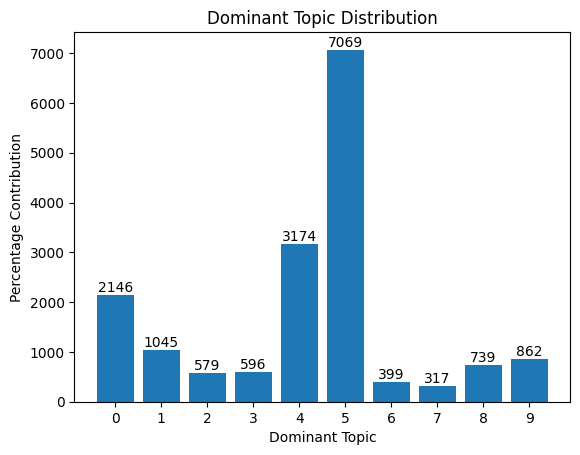

In [ ]:
# Topic distribution before grouping
dominat_topic_df = format_topics_sentences(lda_trained, lda.corpus, lda.clean_data["comment"].tolist())
count_topic = dominat_topic_df["Dominant_Topic"].value_counts().sort_index()
plt.bar(count_topic.index, count_topic.values)
for i in range(len(count_topic)):
    plt.text(count_topic.index[i], count_topic.values[i], count_topic.values[i], ha='center', va='bottom')
plt.xlabel("Dominant Topic")
plt.ylabel("Percentage Contribution")
plt.title("Dominant Topic Distribution")
plt.xticks(count_topic.index)
plt.show()

In [ ]:
# Topic distribution After grouping
grouping_dict = {"Price": [9], "Pack": [1, 5], "Serve": [0], "Quality": [2, 3, 4, 8], "Spam": [7]}
dominat_topic_df["Topic_Quality"] = dominat_topic_df["Dominant_Topic"].apply(lambda x: 1 if x in grouping_dict["Quality"] else 0)
dominat_topic_df["Topic_Serve"] = dominat_topic_df["Dominant_Topic"].apply(lambda x: 1 if x in grouping_dict["Serve"] else 0)
dominat_topic_df["Topic_Price"] = dominat_topic_df["Dominant_Topic"].apply(lambda x: 1 if x in grouping_dict["Price"] else 0)
dominat_topic_df["Topic_Shipping_Pack"] = dominat_topic_df["Dominant_Topic"].apply(lambda x: 1 if x in grouping_dict["Pack"] else 0)
dominat_topic_df["Topic_Spam"] = dominat_topic_df["Dominant_Topic"].apply(lambda x: 1 if x in grouping_dict["Spam"] else 0)

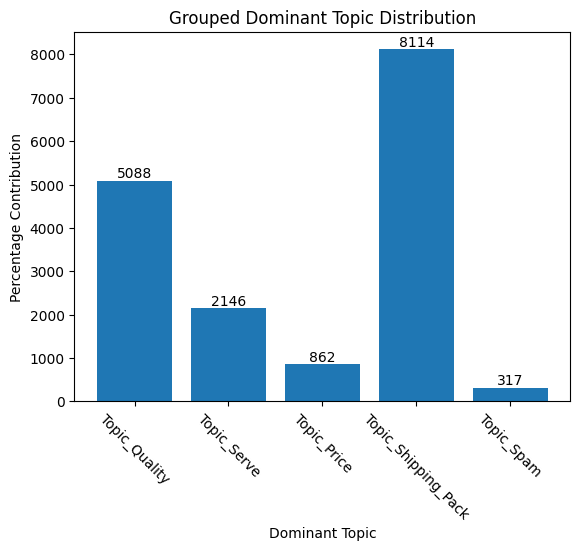

In [ ]:
grouped_count = dominat_topic_df[["Topic_Quality", "Topic_Serve", "Topic_Price", "Topic_Shipping_Pack", "Topic_Spam"]].sum()
plt.bar(grouped_count.index, grouped_count.values)
for i in range(len(grouped_count)):
    plt.text(grouped_count.index[i], grouped_count.values[i], grouped_count.values[i], ha='center', va='bottom')
plt.xlabel("Dominant Topic")
plt.ylabel("Percentage Contribution")
plt.title("Grouped Dominant Topic Distribution")
plt.xticks(grouped_count.index, rotation = -45)
plt.show()

In [ ]:
topics_docs = lda.clean_data
topics_docs["Topics"] = lda.get_prob_features()

In [ ]:
topics_docs["predict_Serve"] = topics_docs["Topics"].apply(lambda x: 1 if set(x).intersection(grouping_dict["Serve"]) else 0)
topics_docs["predict_Shipping"] = topics_docs["Topics"].apply(lambda x: 1 if set(x).intersection(grouping_dict["Pack"]) else 0)
topics_docs["predict_Pack"] = topics_docs["Topics"].apply(lambda x: 1 if set(x).intersection(grouping_dict["Pack"]) else 0)
topics_docs["predict_Quality"] = topics_docs["Topics"].apply(lambda x: 1 if set(x).intersection(grouping_dict["Quality"]) else 0)
topics_docs

,Quality,Serve,Pack,Shipping,Price,Other,rating,comment,clean_comment,tokens,Topics,predict_Serve,predict_Shipping,predict_Pack,predict_Quality
0,1,0,1,0,0.0,0,3,Chất lượng sản phẩm:được\n\nĐóng gói ko cẩn th...,chất lượng sản phẩm được đóng gói không cẩn ...,"[chất lượng, sản phẩm, đóng gói, cẩn thận]",[5],0,1,1,0
1,1,0,0,1,0.0,0,4,Đúng với mô tả:đúng\nChất lượng sản phẩm:oke\n...,đúng với mô tả đúng chất lượng sản phẩm ok...,"[mô tả, chất lượng, sản phẩm, ok, giỏ, hàng, đ...",[5],0,1,1,0
2,1,0,0,1,0.0,0,5,Nhận hàng nhanh\nHàng như ảnh\n*hình ảnh và vi...,nhận hàng nhanh hàng như ảnh hình ảnh và vid...,"[hàng, hàng, ảnh, hình ảnh, video, xu, hàng, q...","[2, 5, 6]",0,1,1,1
3,1,0,0,1,1.0,0,4,"Mặc dù sản phẩm ổn, giá tốt nhưng chuẩn bị hàn...",mặc dù sản phẩm ổn giá tốt nhưng chuẩn bị hà...,"[mặc dù, sản phẩm, ổn, giá, hàng, giao]",[5],0,1,1,0
4,1,0,0,1,1.0,0,4,Chất liệu:lụa\nĐúng với mô tả:đúng\nMàu sắc:đe...,chất liệu lụa đúng với mô tả đúng màu sắc ...,"[chất liệu, lụa, mô tả, màu sắc, đen, váy, xin...","[2, 4, 6]",0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17045,1,0,0,0,NaN,0,5,-Ruột gối cao cấp lõi bông gòn đã qua xử lí \n...,ruột gối cao cấp lõi bông gòn đã qua xử lí ê...,"[ruột, gối, cao cấp, lõi, gòn, xử lí, êm ái, m...","[0, 4, 5, 6]",1,1,1,1
17046,0,0,0,0,NaN,1,5,Chai Spray King (dung tích 400ml) có công dụng...,chai spray king dung tích ml có công dụng ...,"[chai, spray, king, dung tích, ml, công dụng, ...","[0, 2, 3, 7, 8, 9]",1,0,0,1
17047,0,0,0,0,NaN,1,5,Nước Giặt Ariel Túi là sản phẩm được nhiều ngư...,nước giặt ariel túi là sản phẩm được nhiều ngư...,"[giặt, ariel túi, sản phẩm, ưa chuộng, tính nă...","[3, 4, 5]",0,1,1,1
17048,1,0,0,1,NaN,0,5,Thời gian giao hàng dự kiến cho sản phẩm này l...,thời gian giao hàng dự kiến cho sản phẩm này l...,"[giao, hàng, dự kiến, sản phẩm, sản phẩm, chất...","[1, 4, 5]",0,1,1,1


In [ ]:
from sklearn.metrics import hamming_loss
from sklearn.metrics import classification_report
import pandas as pd


label_cols = ["Quality", "Pack", "Serve", "Shipping"]
predict_cols = ["predict_Quality", "predict_Pack", "predict_Serve", "predict_Shipping"]
print("Classification report from LDA model")
print('Hamming Loss: ', round(hamming_loss(topics_docs[label_cols], topics_docs[predict_cols]),2))
print(classification_report(topics_docs[label_cols],  topics_docs[predict_cols]))
for i in range(len(label_cols)):
  print(f"classification report of {label_cols[i]}")
  print(classification_report(topics_docs[label_cols[i]], topics_docs[predict_cols[i]]))

Classification report from LDA model
Hamming Loss:  0.42
              precision    recall  f1-score   support

           0       0.76      0.67      0.71     12509
           1       0.24      0.97      0.38      2949
           2       0.36      0.64      0.46      3014
           3       0.45      0.84      0.59      6537

   micro avg       0.46      0.75      0.57     25009
   macro avg       0.45      0.78      0.54     25009
weighted avg       0.57      0.75      0.61     25009
 samples avg       0.48      0.67      0.53     25009

classification report of Quality
              precision    recall  f1-score   support

           0       0.30      0.41      0.35      4417
           1       0.76      0.67      0.71     12509

    accuracy                           0.60     16926
   macro avg       0.53      0.54      0.53     16926
weighted avg       0.64      0.60      0.62     16926

classification report of Pack
              precision    recall  f1-score   support

         

In [ ]:
lda_4  = UnsupervisedModels(data, model = "LDA")
lda_trained_4 = lda.train_gensim_models(evaluate = True, num_topics = 5)
lda_trained_4.print_topics()

[(0,
  '0.029*"hàng" + 0.028*"cửa hàng" + 0.014*"mua" + 0.012*"giao" + 0.012*"gửi" + 0.010*"da" + 0.009*"h" + 0.007*"shope" + 0.006*"đi" + 0.006*"đổi"'),
 (1,
  '0.035*"tai" + 0.028*"mua" + 0.014*"pin" + 0.013*"sạc" + 0.011*"cửa hàng" + 0.010*"loa" + 0.009*"tiếng" + 0.008*"xài" + 0.007*"tệ" + 0.007*"trả lời"'),
 (2,
  '0.096*"hàng" + 0.069*"giao" + 0.065*"sản phẩm" + 0.040*"chất lượng" + 0.039*"ok" + 0.033*"cửa hàng" + 0.026*"đóng gói" + 0.024*"mua" + 0.022*"đẹp" + 0.022*"giá"'),
 (3,
  '0.049*"️ positive" + 0.016*"dây" + 0.014*"…" + 0.012*"d" + 0.010*"kết nối" + 0.008*"️" + 0.007*"https" + 0.007*"the" + 0.006*"cắm" + 0.006*"s"'),
 (4,
  '0.032*"màu" + 0.030*"chất liệu" + 0.027*"màu sắc" + 0.025*"mô tả" + 0.021*"vải" + 0.021*"giao" + 0.018*"đẹp" + 0.016*"hơi" + 0.016*"đen" + 0.016*"áo"')]

## 2. Bertopic

In [ ]:
# bertopic with 4 topics
bertopic = UnsupervisedModels(data)
vectorizer_model = TfidfVectorizer(stop_words=STOPWORDS, tokenizer=word_tokenize, min_df = 0.2)
bertopic_trained = bertopic.train_bertopic(vectorizer = vectorizer_model, evaluate = False, num_topics = 5)

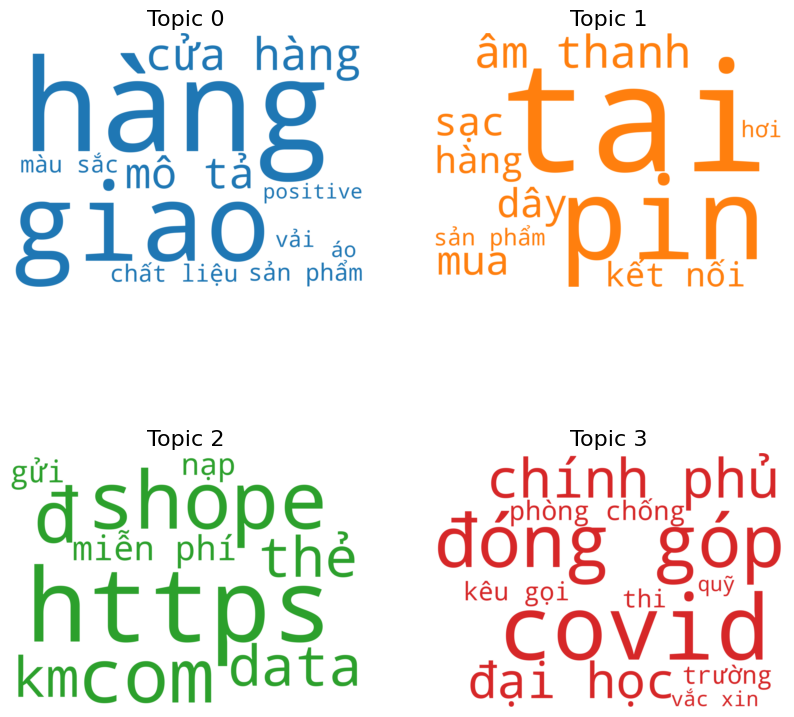

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(10,10), sharex=True, sharey=True)
for i, ax in enumerate(axes.flatten()):
  create_wordcloud(bertopic_trained[0], i, ax)
  ax.set_title('Topic ' + str(i), fontdict=dict(size=16))

In [ ]:
bertopic = UnsupervisedModels(data)
vectorizer_model = TfidfVectorizer(stop_words=STOPWORDS, tokenizer=word_tokenize, min_df = 0.2)
bow = CountVectorizer(stop_words=STOPWORDS, tokenizer=word_tokenize, min_df = 0.2)
bertopic_trained = bertopic.train_bertopic(vectorizer = vectorizer_model, evaluate = False, num_topics = 11)

modules.json:   0%|          | 0.00/229 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/4.12k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/645 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/471M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/480 [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/9.08M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/239 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [ ]:
def create_wordcloud(topic_model, topic, ax):
    text = {word: value for word, value in topic_model.get_topic(topic)}
    wc = WordCloud(stopwords=STOPWORDS,
                  background_color='white',
                  width=2500,
                  height=1800,
                  max_words=10,
                  colormap='tab10',
                  color_func=lambda *args, **kwargs: cols[i],
                  prefer_horizontal=1.0)
    wc.generate_from_frequencies(text)
    ax.imshow(wc, interpolation="bilinear")
    ax.axis("off")

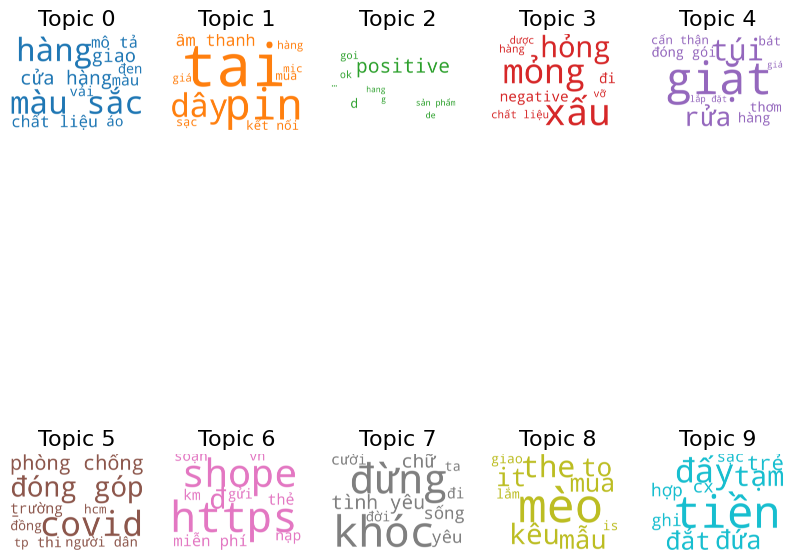

In [ ]:
fig, axes = plt.subplots(2, 5, figsize=(10,10), sharex=True, sharey=True)
for i, ax in enumerate(axes.flatten()):
  create_wordcloud(bertopic_trained[0], i, ax)
  ax.set_title('Topic ' + str(i), fontdict=dict(size=16))

In [ ]:
inference_result = bertopic.clean_data.copy()
bertopic_output = bertopic_trained[0].transform(bertopic.clean_data["clean_comment"].tolist())


In [ ]:
inference_result["Topics"] = bertopic_output[0]
inference_result["Probability"] = bertopic_output[1]

In [ ]:
inference_result[inference_result["Topics"] == 6]

## 3. Top2vec

In [ ]:
top2vec = UnsupervisedModels(data)
top2vec_trained = top2vec.train_top2vec(evaluate = True, nr_topics = 10)

2024-04-22 06:42:59,706 - top2vec - INFO - Pre-processing documents for training
INFO:top2vec:Pre-processing documents for training
2024-04-22 06:43:20,500 - top2vec - INFO - Downloading distiluse-base-multilingual-cased model
INFO:top2vec:Downloading distiluse-base-multilingual-cased model


modules.json:   0%|          | 0.00/341 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/2.39k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/607 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/539M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/528 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/996k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.96M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.58M [00:00<?, ?B/s]

rust_model.ot:   0%|          | 0.00/1.58M [00:00<?, ?B/s]

2_Dense/config.json:   0%|          | 0.00/114 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.58M [00:00<?, ?B/s]

2024-04-22 06:44:09,880 - top2vec - INFO - Creating joint document/word embedding
INFO:top2vec:Creating joint document/word embedding
2024-04-22 06:44:34,847 - top2vec - INFO - Creating lower dimension embedding of documents
INFO:top2vec:Creating lower dimension embedding of documents
2024-04-22 06:45:10,784 - top2vec - INFO - Finding dense areas of documents
INFO:top2vec:Finding dense areas of documents
2024-04-22 06:45:14,503 - top2vec - INFO - Finding topics
INFO:top2vec:Finding topics


error: nhanh
error: bán
error: tốt
error: rõ
error: nhanh
error: tốt
error: khó
error: thiếu


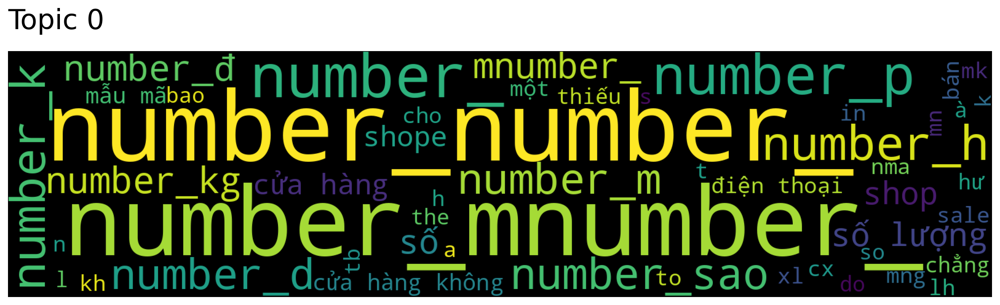

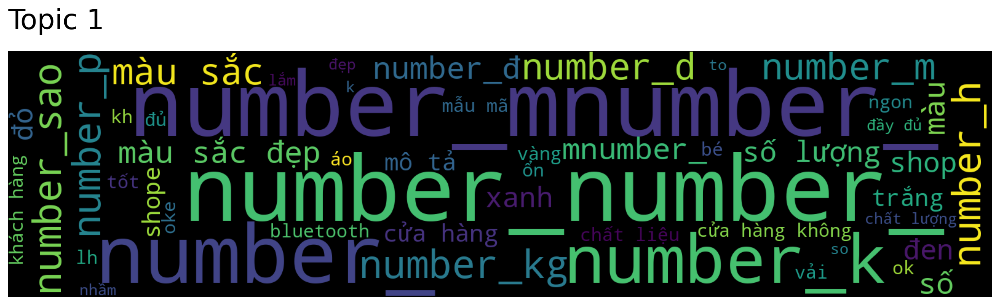

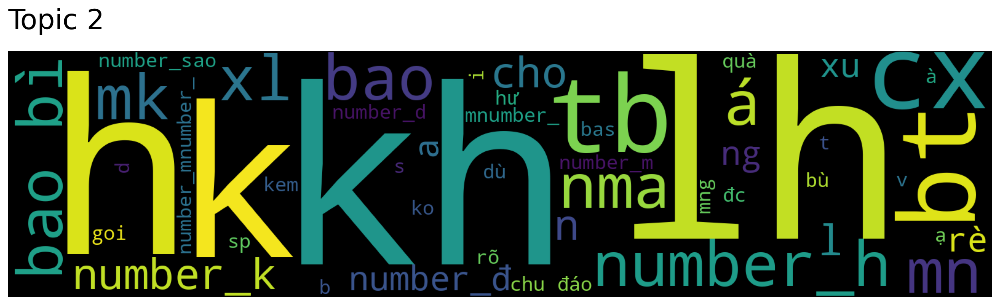

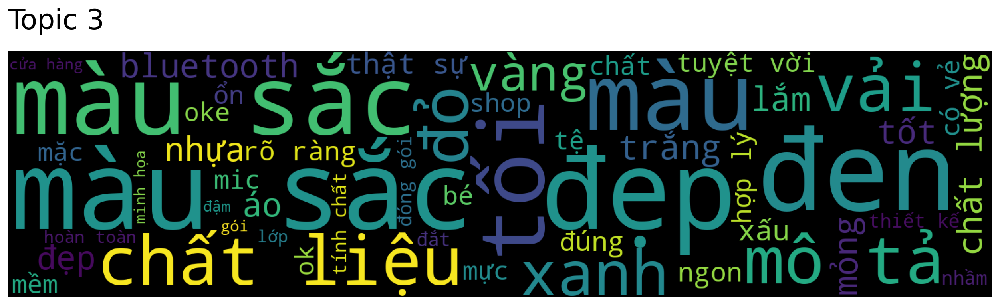

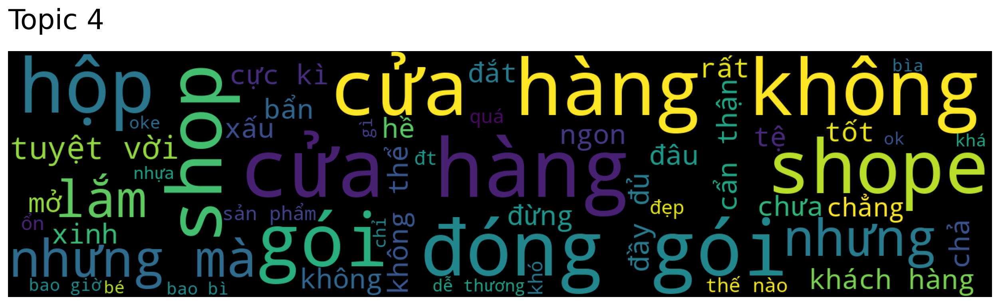

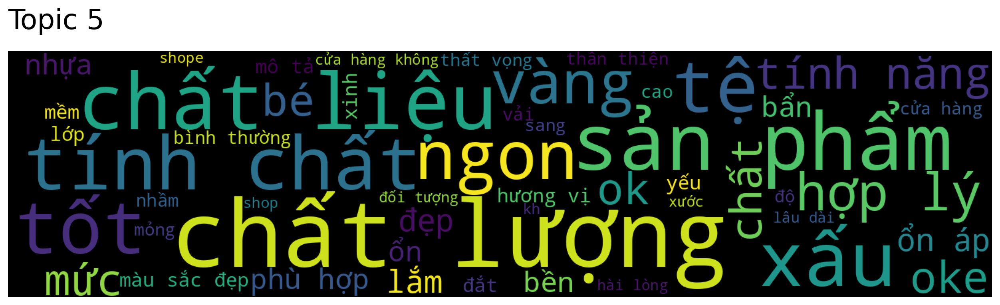

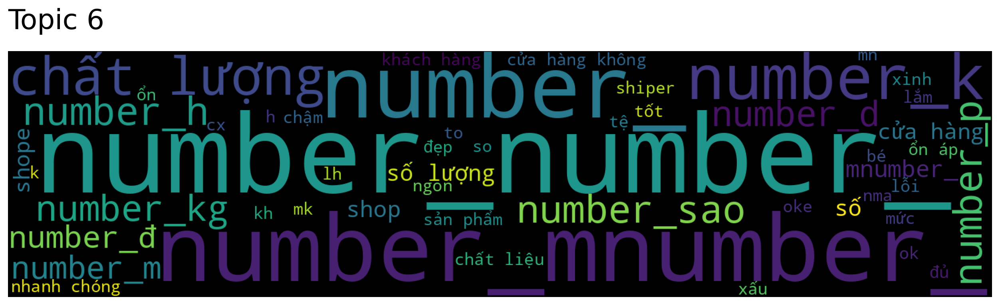

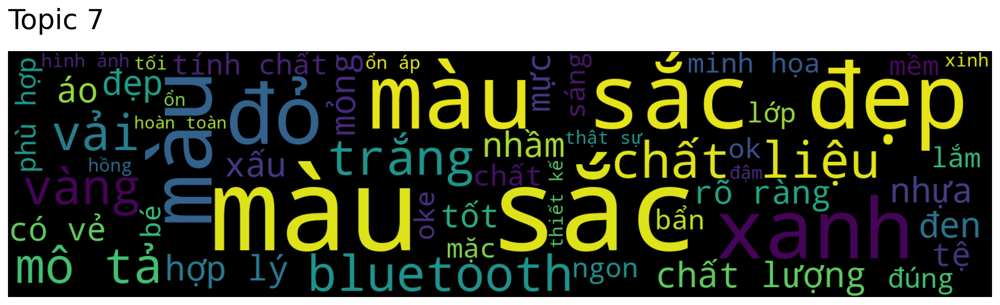

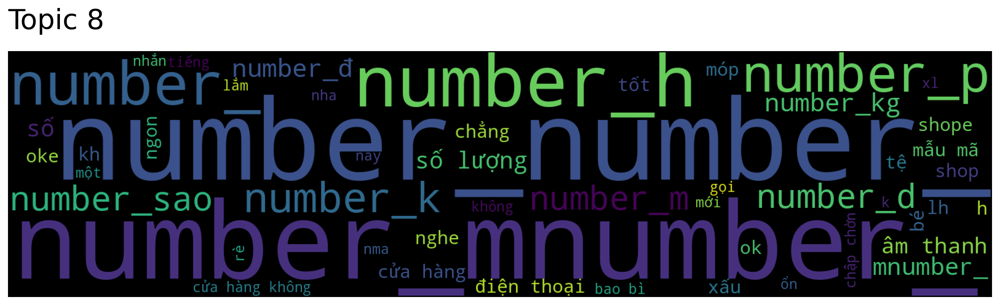

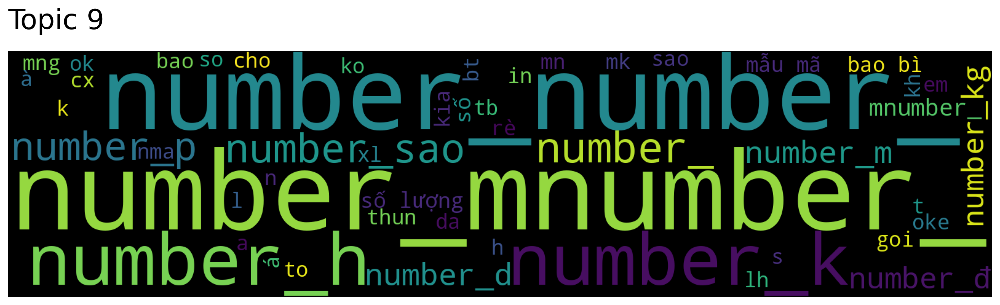

In [ ]:
for topic in range(10):
    top2vec_trained.generate_topic_wordcloud(topic, background_color='white')

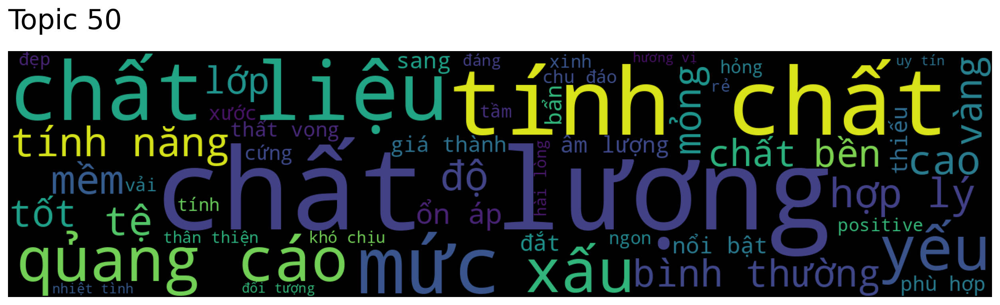

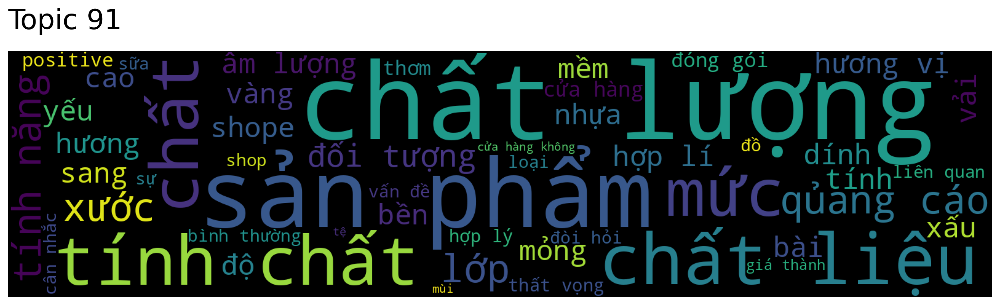

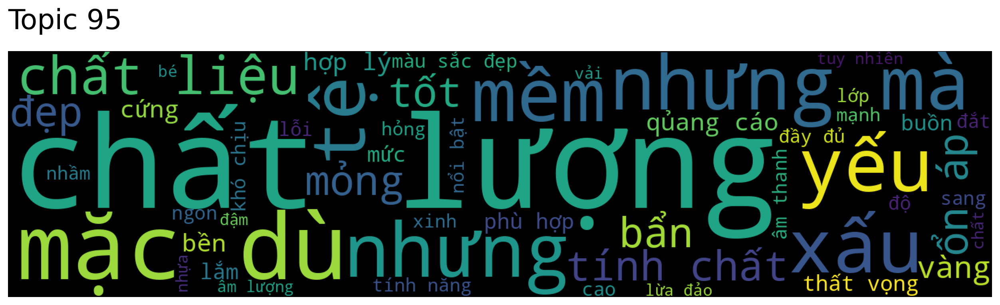

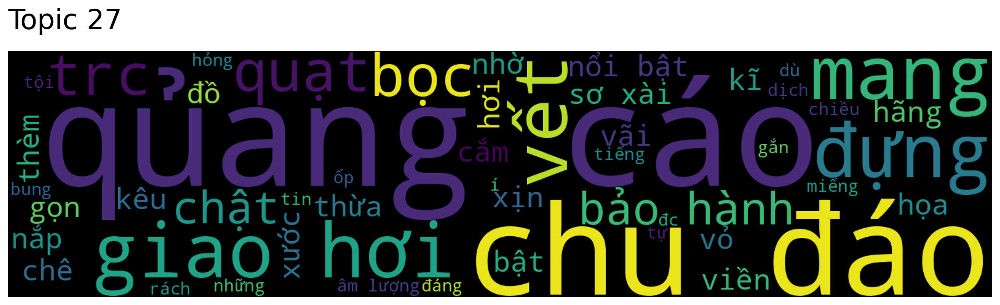

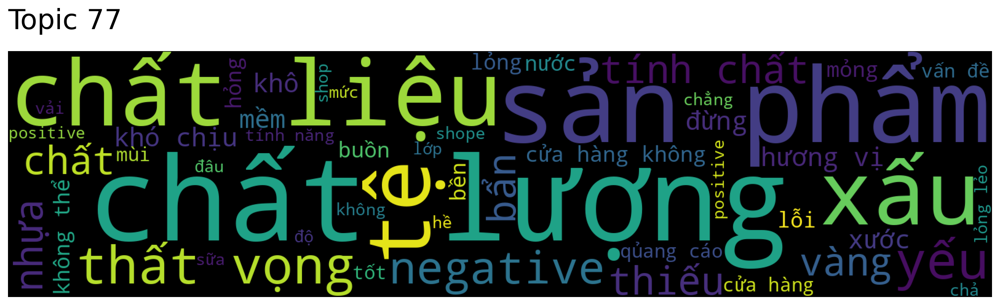

In [ ]:
topic_words, word_scores, topic_scores, topic_nums = top2vec_trained.search_topics(keywords=["chất lượng"], num_topics=5)
for topic in topic_nums:
    top2vec_trained.generate_topic_wordcloud(topic)

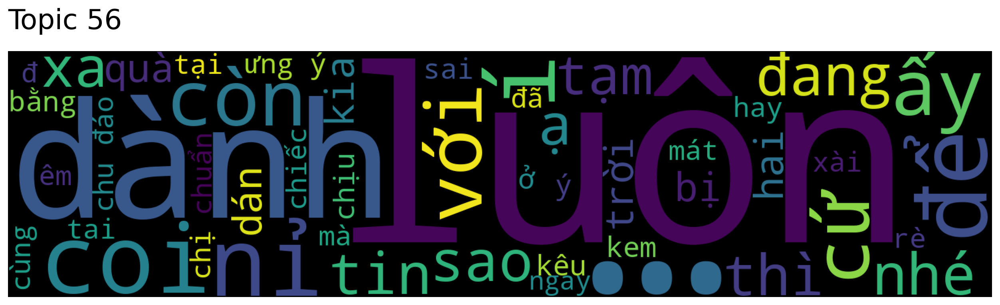

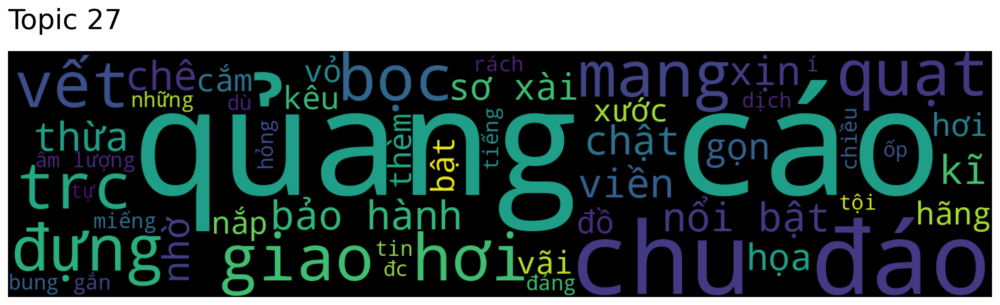

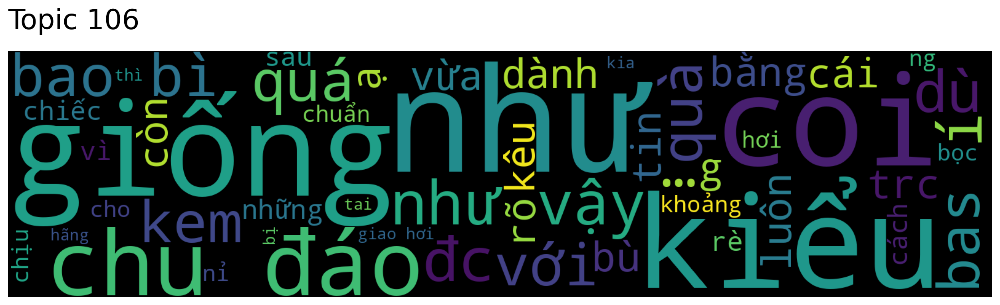

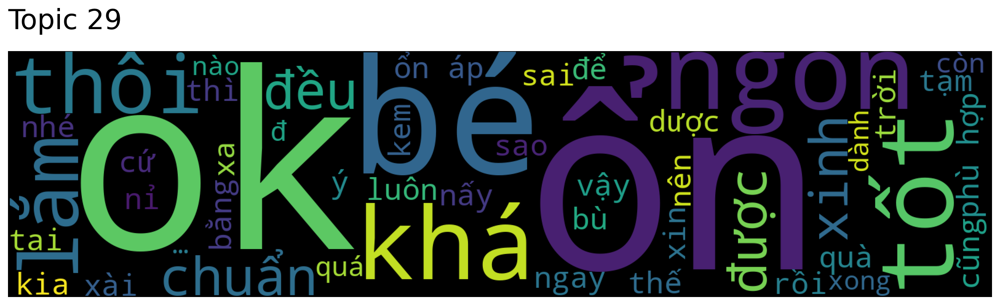

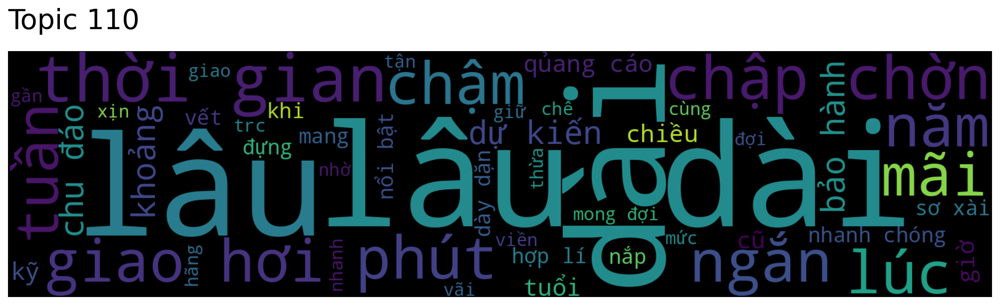

In [ ]:
topic_words, word_scores, topic_scores, topic_nums = top2vec_trained.search_topics(keywords=["giao"], num_topics=5)
for topic in topic_nums:
    top2vec_trained.generate_topic_wordcloud(topic)

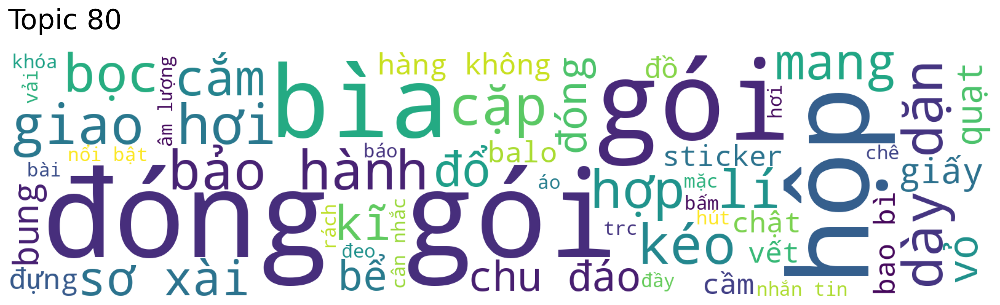

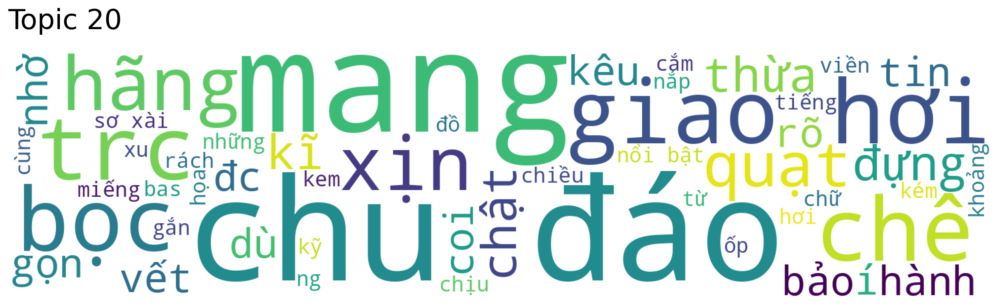

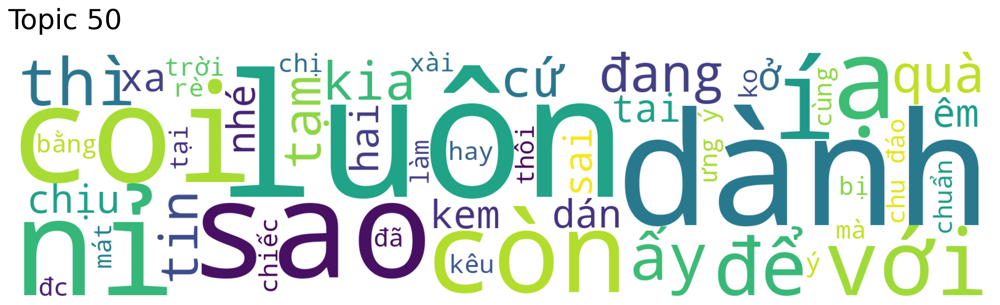

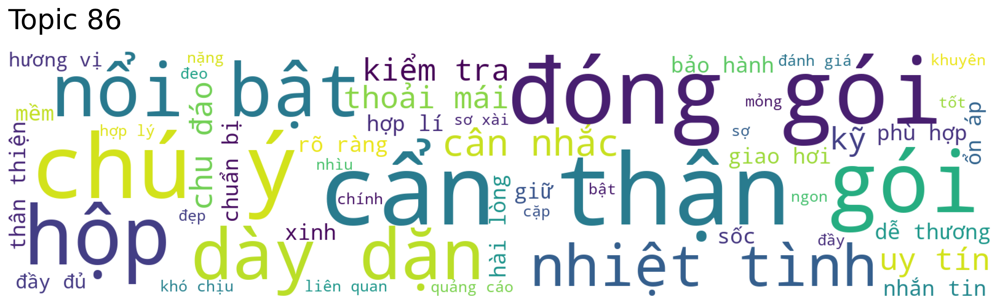

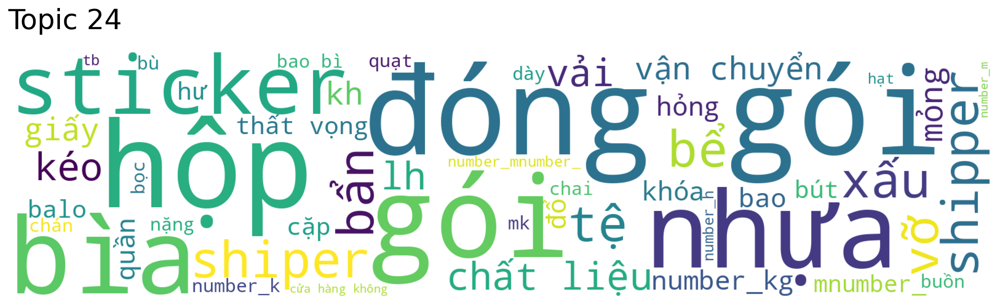

In [ ]:
topic_words, word_scores, topic_scores, topic_nums = top2vec_trained.search_topics(keywords=["đóng gói"], num_topics=5)
for topic in topic_nums:
    top2vec_trained.generate_topic_wordcloud(topic, background_color='white')

In [ ]:
words, word_scores = top2vec_trained.similar_words(keywords=["sản phẩm"], keywords_neg=[], num_words=20)
for word, score in zip(words, word_scores):
    print(f"{word} {score}")

hàng 0.6862028031936145
đồ 0.6752392644441627
bài 0.6732982659191252
dính 0.6670161267815806
xước 0.6662612547535297
chất 0.6504342774265031
sự 0.6409818738577037
tính 0.6404458946509919
mang 0.6325926876511073
hãng 0.6316191552724844
vãi 0.6284916964883946
báo 0.6280337510248211
họa 0.628026916143509
mẫu 0.6278039491657117
sạc 0.6270496526924298
chất liệu 0.6229993151343074
nhờ 0.6222101670661206
viền 0.6199588353477414
đối tượng 0.6186290082501953
sổ 0.61651510567884


In [ ]:
words, word_scores = top2vec_trained.similar_words(keywords=["bọc", "sản phẩm"], keywords_neg=[], num_words=20)
for word, score in zip(words, word_scores):
    print(f"{word} {score}")

đồ 0.9002191080357377
hàng 0.8913835213847929
đựng 0.8839981151931435
hãng 0.8784073029512194
mang 0.8769350797440572
chê 0.8716459660125431
xước 0.8714864424578102
viền 0.8687558442571841
kĩ 0.8647795123237199
bài 0.864436900065794
vết 0.8637966749957819
miếng 0.8628108391517424
trc 0.860810554388853
dính 0.8605937677915111
họa 0.8598515280784583
thừa 0.8563774282825297
bật 0.8561846234335279
chật 0.8530965594877493
sự 0.8523657071462882
gắn 0.8514319724058275


In [ ]:
top2vec_doc2vec = UnsupervisedModels(data)
top2vec_trained_doc2vec = top2vec_doc2vec.train_top2vec(evaluate = True, embedding_model = "doc2vec")

In [ ]:
topics = top2vec_trained.get_topics()
for topic_id in range(len(topics[0])):
    print(f"Topic {topic_id}")
    for i in range(10):
      print(f"words: {topics[0][topic_id][i]}, score: {topics[1][topic_id][i]}")

Topic 0
words: màu sắc đẹp, score: 0.35998785495758057
words: màu sắc, score: 0.3494264483451843
words: màu, score: 0.26561328768730164
words: xanh, score: 0.20313426852226257
words: đỏ, score: 0.19319605827331543
words: đen, score: 0.19259119033813477
words: trắng, score: 0.18684807419776917
words: chất liệu, score: 0.1685304343700409
words: vải, score: 0.16099141538143158
words: mô tả, score: 0.1598816215991974
Topic 1
words: number_number_, score: 0.6631528735160828
words: number_mnumber_, score: 0.6538099050521851
words: number_, score: 0.6134730577468872
words: number_p, score: 0.6056399345397949
words: number_h, score: 0.6048944592475891
words: number_k, score: 0.6028590202331543
words: number_sao, score: 0.6002448201179504
words: number_d, score: 0.5768736600875854
words: number_m, score: 0.5723173022270203
words: number_kg, score: 0.5397026538848877
Topic 2
words: number_number_, score: 0.39192110300064087
words: number_mnumber_, score: 0.3902737498283386
words: number_, score:

In [ ]:
topics = top2vec_trained_doc2vec.get_topics()
for topic_id in range(len(topics[0])):
    print(f"Topic {topic_id}")
    for i in range(10):
      print(f"words: {topics[0][topic_id][i]}, score: {topics[1][topic_id][i]}")

Topic 0
words: và, score: 0.8093912601470947
words: về, score: 0.7886230945587158
words: number_number_, score: 0.7838388085365295
words: tay, score: 0.7836858630180359
words: nữa, score: 0.7811522483825684
words: cảm giác, score: 0.7749456763267517
words: mấy, score: 0.7715319991111755
words: đểu, score: 0.7682746052742004
words: lên, score: 0.7680809497833252
words: như vậy, score: 0.7668454647064209
Topic 1
words: dành, score: 0.814944326877594
words: loại, score: 0.8068915009498596
words: mặt, score: 0.7832116484642029
words: công dụng, score: 0.7795210480690002
words: hương, score: 0.7729684710502625
words: da, score: 0.769696056842804
words: sạch, score: 0.7549528479576111
words: rửa, score: 0.7539983987808228
words: đổ, score: 0.7454630732536316
words: khô, score: 0.7372875809669495
